# Professor Python's Fight Night

### By Anthony Ostuni

Computer science professor [John Dickerson](http://jpdickerson.com/) has gotten sick of dealing with students and has quit his job. During his newfound unemployment, he's had extra time to catch up on his favorite TV shows: The UFC and Captain America. Feeling inspired, John decides to create his own "super serum" in order to bolster his abilities to join the UFC as the merciless bone-crusher, *Professor Python*. 

Before John can join the ranks of the elite, he first needs to determine what makes a successful fighter, so in a tale of great irony, he must return to his computer science roots for some data analysis.

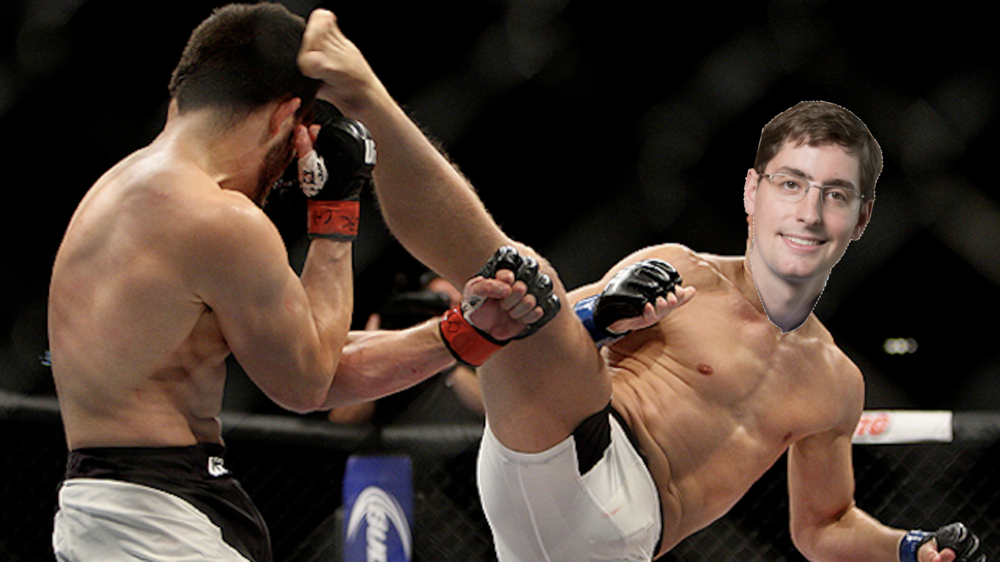

In [678]:
# this unfortunately appears to be the only way to get the image to show up when exporting to HTML
from IPython.display import Image 
Image(filename="John1.png")

### Table of Contents
* Round 1: [Introduction and Getting Started](#Round-1:-Introduction-and-Getting-Started)
* Round 2: [Data Tidying and Manipulation](#Round-2:-Data-Tidying-and-Manipulation)
* Round 3: [Exploratory Data Analysis](#Round-3:-Exploratory-Data-Analysis)
* Round 4: [Predicting Fight Results](#Round-4:-Predicting-Fight-Results)
* Round 5: [Conclusions and Further Work](#Round-5:-Conclusions-and-Further-Work)

## Round 1: Introduction and Getting Started

"How peculiar," John thinks to himself, "I feel the overwelming urge to provide background knowledge on the UFC and sport of MMA as can be referenced [here](https://www.ufc.com/about/sport)." John continues:

> Starting in 1993 as a professional mixed martial arts (MMA) organization, UFC has revolutionized the fight business and today stands as a premium global sports brand, media content company and the largest Pay-Per-View (PPV) event provider in the world.
>
> In January 2001, under the new ownership of Zuffa, LLC and guided by the leadership of owners Frank Fertitta III, Lorenzo Fertitta, and Dana White, the UFC brand restructured MMA into a highly organized, sanctioned and controlled combat sport.
>
> Mixed martial arts (MMA) is a full-contact combat sport that allows a wide variety of fighting techniques and skills from a mixture of other combat sports to be used in competition. The rules allow usage of both striking and grappling techniques while standing and on the ground. Competitions allow athletes of different backgrounds to compete.

John's first step is to acquire the relevant data. Dreading the hassle of web scraping, he does a quick search in hopes that someone else has already done this tedious work. Fortunately for John, [kaggle](https://www.kaggle.com/) user "Rajeev Warrier" has compiled an excellent [dataset](https://www.kaggle.com/rajeevw/ufcdata) of UFC fights (1993-2019) that can be used for the desired analysis.

As is preliminary for most analysis, John must import the necessary libraries,

In [679]:
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline

Next, he will import the actual data into the DataFrame `fights` and check how the data looks.

In [680]:
fights = pd.read_csv("data.csv")
fights.head()

,R_fighter,B_fighter,Referee,date,location,Winner,title_bout,weight_class,no_of_rounds,B_current_lose_streak,...,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_wins,R_Stance,R_Height_cms,R_Reach_cms,R_Weight_lbs,B_age,R_age
0,Henry Cejudo,Marlon Moraes,Marc Goddard,2019-06-08,"Chicago, Illinois, USA",Red,True,Bantamweight,5,0.0,...,2.0,0.0,0.0,8.0,Orthodox,162.56,162.56,135.0,31.0,32.0
1,Valentina Shevchenko,Jessica Eye,Robert Madrigal,2019-06-08,"Chicago, Illinois, USA",Red,True,Women's Flyweight,5,0.0,...,0.0,2.0,0.0,5.0,Southpaw,165.10,167.64,125.0,32.0,31.0
2,Tony Ferguson,Donald Cerrone,Dan Miragliotta,2019-06-08,"Chicago, Illinois, USA",Red,False,Lightweight,3,0.0,...,3.0,6.0,1.0,14.0,Orthodox,180.34,193.04,155.0,36.0,35.0
3,Jimmie Rivera,Petr Yan,Kevin MacDonald,2019-06-08,"Chicago, Illinois, USA",Blue,False,Bantamweight,3,0.0,...,1.0,0.0,0.0,6.0,Orthodox,162.56,172.72,135.0,26.0,29.0
4,Tai Tuivasa,Blagoy Ivanov,Dan Miragliotta,2019-06-08,"Chicago, Illinois, USA",Blue,False,Heavyweight,3,0.0,...,2.0,0.0,0.0,3.0,Southpaw,187.96,190.50,264.0,32.0,26.0


## Round 2: Data Tidying and Manipulation

John is pleasantly surprised at the well-organized data, but notices that not all the columns are visible from this preview. Thus, he checks what features are available.

In [681]:
columns = list(fights.columns.values)
print('Number of Rows: ', fights.shape[0])
print('Number of Columns: ', fights.shape[1])
columns

Number of Rows:  5144
Number of Columns:  145


['R_fighter',
 'B_fighter',
 'Referee',
 'date',
 'location',
 'Winner',
 'title_bout',
 'weight_class',
 'no_of_rounds',
 'B_current_lose_streak',
 'B_current_win_streak',
 'B_draw',
 'B_avg_BODY_att',
 'B_avg_BODY_landed',
 'B_avg_CLINCH_att',
 'B_avg_CLINCH_landed',
 'B_avg_DISTANCE_att',
 'B_avg_DISTANCE_landed',
 'B_avg_GROUND_att',
 'B_avg_GROUND_landed',
 'B_avg_HEAD_att',
 'B_avg_HEAD_landed',
 'B_avg_KD',
 'B_avg_LEG_att',
 'B_avg_LEG_landed',
 'B_avg_PASS',
 'B_avg_REV',
 'B_avg_SIG_STR_att',
 'B_avg_SIG_STR_landed',
 'B_avg_SIG_STR_pct',
 'B_avg_SUB_ATT',
 'B_avg_TD_att',
 'B_avg_TD_landed',
 'B_avg_TD_pct',
 'B_avg_TOTAL_STR_att',
 'B_avg_TOTAL_STR_landed',
 'B_longest_win_streak',
 'B_losses',
 'B_avg_opp_BODY_att',
 'B_avg_opp_BODY_landed',
 'B_avg_opp_CLINCH_att',
 'B_avg_opp_CLINCH_landed',
 'B_avg_opp_DISTANCE_att',
 'B_avg_opp_DISTANCE_landed',
 'B_avg_opp_GROUND_att',
 'B_avg_opp_GROUND_landed',
 'B_avg_opp_HEAD_att',
 'B_avg_opp_HEAD_landed',
 'B_avg_opp_KD',
 'B_av

"145 COLUMNS??" he exclaims, "I might as well beg for my job back rather than look through all that data!" 

However, a second glance calms his nerves, as he notices many of the features are not relevant for his purposes. For example, fighting tactics, such as average number of clinches attempted, will not factor in to creating the most effective serum, so he keeps only the information relating to a fighter's physical characteristics and basic information and drops the remaining columns.

In [682]:
columns_of_interest = ['R_fighter', 'B_fighter', 'Winner', 'weight_class', 'date',
                       'B_draw', 'B_losses', 'B_wins', 'B_Stance', 'B_Height_cms', 'B_Reach_cms', 'B_Weight_lbs',
                       'R_draw', 'R_losses', 'R_wins', 'R_Stance', 'R_Height_cms', 'R_Reach_cms', 'R_Weight_lbs']
fights = fights[columns_of_interest]
fights.head()

,R_fighter,B_fighter,Winner,weight_class,date,B_draw,B_losses,B_wins,B_Stance,B_Height_cms,B_Reach_cms,B_Weight_lbs,R_draw,R_losses,R_wins,R_Stance,R_Height_cms,R_Reach_cms,R_Weight_lbs
0,Henry Cejudo,Marlon Moraes,Red,Bantamweight,2019-06-08,0.0,1.0,4.0,Orthodox,167.64,170.18,135.0,0.0,2.0,8.0,Orthodox,162.56,162.56,135.0
1,Valentina Shevchenko,Jessica Eye,Red,Women's Flyweight,2019-06-08,0.0,6.0,4.0,Orthodox,167.64,167.64,125.0,0.0,2.0,5.0,Southpaw,165.10,167.64,125.0
2,Tony Ferguson,Donald Cerrone,Red,Lightweight,2019-06-08,0.0,8.0,23.0,Orthodox,185.42,185.42,155.0,0.0,1.0,14.0,Orthodox,180.34,193.04,155.0
3,Jimmie Rivera,Petr Yan,Blue,Bantamweight,2019-06-08,0.0,0.0,4.0,Switch,170.18,170.18,135.0,0.0,2.0,6.0,Orthodox,162.56,172.72,135.0
4,Tai Tuivasa,Blagoy Ivanov,Blue,Heavyweight,2019-06-08,0.0,1.0,1.0,Southpaw,180.34,185.42,250.0,0.0,1.0,3.0,Southpaw,187.96,190.50,264.0


John breathes a sigh of relief, as this seems much more manageable. 

He decides the next step is to separate the fighters into their own DataFrame `fighters`, in order to more easily analyze what physical characteristics are desired. The simplest strategy is to take each fighter's information from their most recent fight, as a fighter's physical characteristics shouldn't change much, if at all, between fights (unless they've found their own super serum), and the most recent rows will have the most recent records. The only exception to this is a fighter's weight, as it's possible (and potentially likely) for the same fighter to move between weight classes (so their weight must adjust appropriately).

John decides to examine the data before worrying too much about this potential complication. He checks the proportion of fighter-weight class pairs to the number of unique fighters. This is a slightly easier to compute proxy for the number of fighters that fight in more than one weight class, as this method does not distinguish between say a fighter who has competed in four different weight classes and two separate fighters who have each competed in two distinct weight classes. However, John is simply looking for a general approximation, so this proxy is sufficient.

In [683]:
# break the two fighters of each row into their own rows and combine
columns = ['name', 'weight_class']
red_fighters = fights[['R_fighter', 'weight_class']]
red_fighters.columns = columns
blue_fighters = fights[['B_fighter', 'weight_class']]
blue_fighters.columns = columns
fighters = red_fighters.append(blue_fighters)

# calculate the desired proportion
with_weight = len(fighters.drop_duplicates(subset=['name', 'weight_class']).index)
without_weight = len(fighters.drop_duplicates(subset='name').index)
print('Proportion: ', (with_weight - without_weight) / without_weight)

Proportion:  0.32323759791122714


Thus, John concludes there are too many fighters that compete in multiple weight classes to ignore this possibility. He's now faced with a decision. Clearly, he has to keep track of fighter-weight class pairs for more meaningful analysis, but how should he keep track of a fighter's record, since that is irrelevant of the weight classes fought in? 

One option is to keep track of a separate record for each fighter-weight class pair. This has the advantage that it's  easier to tell how a fighter's specific physical attributes lead to performance in a weight class. However, it hides general connections. Perhaps there is some combination of physical characteristics that is especially potent, and it allows for great success at a variety of levels. Partitioning the fighter into essentially several fighters each in their own weight class would lose this information.

The alternative option that could keep such information is to simply have one record for fighter, regardless of what classes were fought in. However, this method also loses some information--maybe a fighter is an absolute fiend in the Welterweight division, but keeps shedding a few pounds to compete in the Lightweight division with little success. Having a single record per fighter would likely classify him or her as a run of the mill athlete, despite a prominent display of ability in a specific division. Additionally, this strategy would prevent the use of weight class as a feature in predicting a fighter's success.

After much consideration, John decides that the first option would likely be better, as it provides more meaningful information about a fighter's success given their physical characteristics, *including weight class*.

As an avid MMA fan, John is familiar with some of the fighters. To ensure the data he is working with matches up with what he knows to be true, he focuses on a specific fighter at each step of the analysis as a kind of "sanity check." He chooses to look for the rows with his personal favorite fighter: Tony "El Cucuy" Ferguson.

In [684]:
# change the record for each fight instance to reflect only the results of that fight
fights.B_draw = [1 if winner == 'Draw' else 0 for (winner, draw) in zip(fights.Winner, fights.B_draw)]
fights.B_wins = [1 if winner == 'Blue' else 0 for (winner, wins) in zip(fights.Winner, fights.B_wins)]
fights.B_losses = [1 if winner == 'Red' else 0 for (winner, loss) in zip(fights.Winner, fights.B_losses)]
fights.R_draw = [1 if winner == 'Draw' else 0 for (winner, draw) in zip(fights.Winner, fights.R_draw)]
fights.R_wins = [1 if winner == 'Red' else 0 for (winner, wins) in zip(fights.Winner, fights.R_wins)]
fights.R_losses = [1 if winner == 'Blue' else 0 for (winner, loss) in zip(fights.Winner, fights.R_losses)]
fights[(fights.R_fighter=="Tony Ferguson") | (fights.B_fighter=="Tony Ferguson")].sort_values(by='date').head()

,R_fighter,B_fighter,Winner,weight_class,date,B_draw,B_losses,B_wins,B_Stance,B_Height_cms,B_Reach_cms,B_Weight_lbs,R_draw,R_losses,R_wins,R_Stance,R_Height_cms,R_Reach_cms,R_Weight_lbs
3531,Ramsey Nijem,Tony Ferguson,Blue,Welterweight,2011-06-04,0,0,1,Orthodox,180.34,193.04,155.0,0,1,0,Orthodox,180.34,190.50,155.0
3445,Tony Ferguson,Aaron Riley,Red,Lightweight,2011-09-24,0,1,0,Southpaw,172.72,175.26,155.0,0,0,1,Orthodox,180.34,193.04,155.0
3369,Tony Ferguson,Yves Edwards,Red,Lightweight,2011-12-03,0,1,0,Southpaw,175.26,185.42,155.0,0,0,1,Orthodox,180.34,193.04,155.0
3239,Tony Ferguson,Michael Johnson,Blue,Lightweight,2012-05-05,0,0,1,Southpaw,177.80,185.42,145.0,0,1,0,Orthodox,180.34,193.04,155.0
2718,Tony Ferguson,Mike Rio,Red,Lightweight,2013-10-19,0,1,0,Orthodox,177.80,180.34,155.0,0,0,1,Orthodox,180.34,193.04,155.0


"Uh-oh," John mumbles to himself. While the DataFrame has been modified as desired, with the record of each fight being the only record recorded in each row, he notices another problem. The fourth row (Tony Ferguson v. Michael Johnson) lists a ten pound weight difference between the two fighters. Naturally, most people assume having a higher weight gives you an advantage (hence why height classes were created). Thus, John is perturbed by this apparent error.

He decides to do some external research on that specific fight to determine what weights the fighters actually fought at. Finding a helpful [website](https://www.tapology.com/fightcenter/bouts/52755-ufc-on-fox-3-michael-the-menace-johnson-vs-tony-el-cucuy-ferguson), he finds the following result:

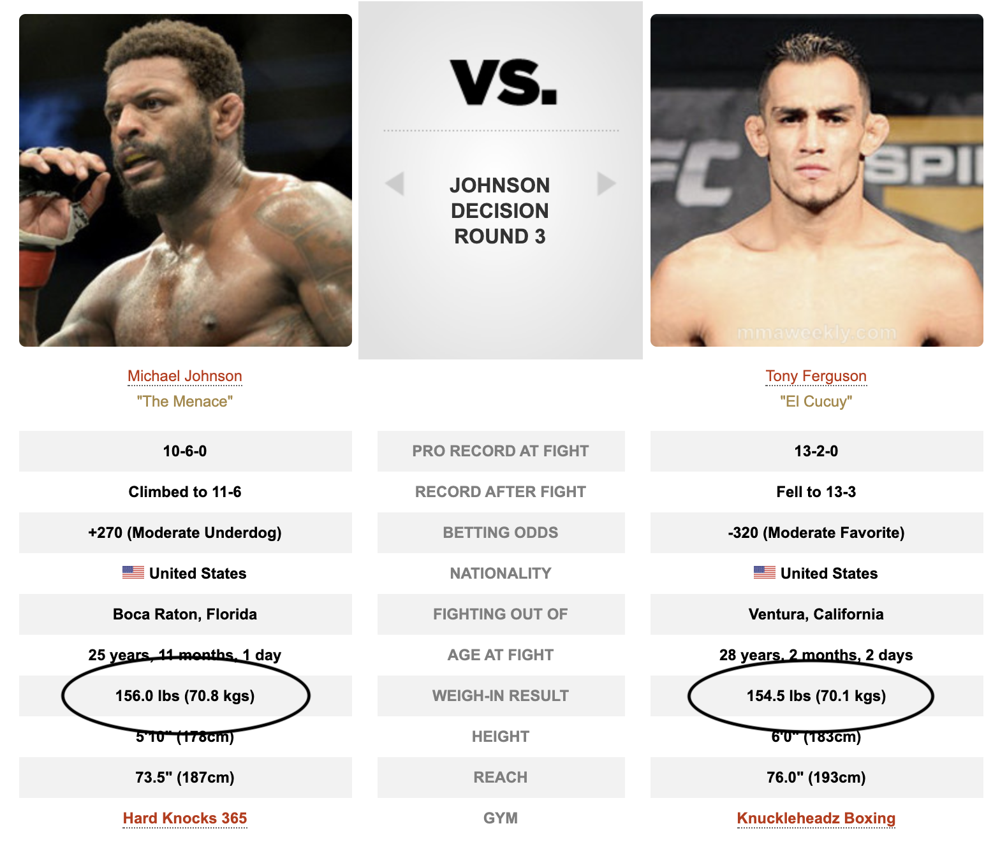

In [685]:
Image(filename="questionable.png")

"Just as I suspected!" John sees that the fighters came into the fight with comparable weights. He makes a mental note to further examine this issue once the rest of the data is organized. It's possible that there are only a few errant measurements, so he tries not to overreact just yet. Worst come to worst, he decides he can simply rely on the weight class as a proxy for weight, as most fighters will likely be as close to the upper weight limit as possible.

Back to the goal at hand, John continues creating the desired `fighters` DataFrame.

In [686]:
# desired column labels for the fighters dataframe
columns = ['name', 'weight_class', 'date', 'draw', 'losses', 'wins', 
           'stance', 'height_cms', 'reach_cms', 'weight_lbs']

# separate the fighters from each row and relabel to be the same
red_fighters = fights[['R_fighter', 'weight_class', 'date', 'R_draw', 'R_losses', 'R_wins', 
                       'R_Stance', 'R_Height_cms', 'R_Reach_cms', 'R_Weight_lbs']]
red_fighters.columns = columns
blue_fighters = fights[['B_fighter', 'weight_class', 'date', 'R_draw', 'B_losses', 'B_wins', 
                        'B_Stance', 'B_Height_cms', 'B_Reach_cms', 'B_Weight_lbs']]
blue_fighters.columns = columns

# combine into one dataframe
fighters = red_fighters.append(blue_fighters).sort_values(by='date', ascending=False)

# find all unique fighter-weight class pairings to essentially be treated as separate fighters
results = [fighters[(fighters.name == name) & (fighters.weight_class == weight)].sum() \
           for (name, weight) in zip(fighters.name, fighters.weight_class)]

# calculate the records for each pair
fighters.draw = [series.draw for series in results]
fighters.wins = [series.wins for series in results]
fighters.losses = [series.losses for series in results]
fighters.drop_duplicates(subset=['name', 'weight_class'], inplace=True)
fighters.head()

,name,weight_class,date,draw,losses,wins,stance,height_cms,reach_cms,weight_lbs
0,Henry Cejudo,Bantamweight,2019-06-08,0,0,2,Orthodox,162.56,162.56,135.0
1,Valentina Shevchenko,Women's Flyweight,2019-06-08,0,0,3,Southpaw,165.10,167.64,125.0
12,Joanne Calderwood,Women's Flyweight,2019-06-08,0,1,3,Orthodox,167.64,165.10,125.0
11,Grigorii Popov,Bantamweight,2019-06-08,0,1,0,Switch,170.18,172.72,135.0
10,Darren Stewart,Middleweight,2019-06-08,0,3,3,Orthodox,182.88,187.96,185.0


He decides that it may be valuable to analyze the data by sex, so he adjusts the weight class column to be agnostic of sex, and adds a separate column for it (M for male, F for female).

In [687]:
fighters['sex'] = ['F' if 'Women' in weight else 'M' for weight in fighters.weight_class]
fighters['weight_class'] = [str.replace(weight, "Women's ", '') for weight in fighters.weight_class]
fighters.head()

,name,weight_class,date,draw,losses,wins,stance,height_cms,reach_cms,weight_lbs,sex
0,Henry Cejudo,Bantamweight,2019-06-08,0,0,2,Orthodox,162.56,162.56,135.0,M
1,Valentina Shevchenko,Flyweight,2019-06-08,0,0,3,Southpaw,165.10,167.64,125.0,F
12,Joanne Calderwood,Flyweight,2019-06-08,0,1,3,Orthodox,167.64,165.10,125.0,F
11,Grigorii Popov,Bantamweight,2019-06-08,0,1,0,Switch,170.18,172.72,135.0,M
10,Darren Stewart,Middleweight,2019-06-08,0,3,3,Orthodox,182.88,187.96,185.0,M


Another change John decides to make is based on the year. As mentioned in his earlier soliloquy, the UFC completely revamped in 2001 under new ownership to institute more formal rules and weight classes. Given that John's technical abilities end somewhere between creating super serums and building time machines, information about the brutish years in the UFC prior to 2001 are not useful, so he drops them.

In [688]:
fighters = fighters[fighters.date.map(lambda x: int(x[:4]) > 2000)]
fighters.sort_values(by='date').head()

,name,weight_class,date,draw,losses,wins,stance,height_cms,reach_cms,weight_lbs,sex
4892,Mark Robinson,Heavyweight,2001-02-23,1,0,0,Orthodox,182.88,NaN,265.0,M
4889,Fabiano Iha,Welterweight,2001-02-23,0,0,3,Orthodox,172.72,NaN,155.0,M
4889,Phil Johns,Welterweight,2001-02-23,0,1,0,Southpaw,157.48,NaN,170.0,M
4890,Elvis Sinosic,Middleweight,2001-02-23,0,0,1,Orthodox,190.50,195.58,205.0,M
4884,Matt Lindland,Light Heavyweight,2001-05-04,0,0,1,Southpaw,182.88,187.96,185.0,M


As a final step of the setup, John decides he needs some absolute metric by which to measure the success of fighters. One popular choice for this type of ranking is win percentage. However, he feels this is not the best metric for this scenario. Such a metric would rank a newbie who has fought and won a single fight above a veteran who has a win-loss record of 100-1! As an alternative, he settles on the simple equation,

*fight score = number of wins - number of losses*

Note that draws have no effect on this score. He recognizes that this method has flaws, as well. Aside from not being the conventional way people speak about the success of a fighter, this method would rank fighters with the win-loss records 20-10 and 10-0 equivalently, which is likely too generous to the former. "Well, I have to pick something," John thinks; "It might as well be this."

In [689]:
fighters['fight_score'] = fighters.wins - fighters.losses
fighters.head()

,name,weight_class,date,draw,losses,wins,stance,height_cms,reach_cms,weight_lbs,sex,fight_score
0,Henry Cejudo,Bantamweight,2019-06-08,0,0,2,Orthodox,162.56,162.56,135.0,M,2
1,Valentina Shevchenko,Flyweight,2019-06-08,0,0,3,Southpaw,165.10,167.64,125.0,F,3
12,Joanne Calderwood,Flyweight,2019-06-08,0,1,3,Orthodox,167.64,165.10,125.0,F,2
11,Grigorii Popov,Bantamweight,2019-06-08,0,1,0,Switch,170.18,172.72,135.0,M,-1
10,Darren Stewart,Middleweight,2019-06-08,0,3,3,Orthodox,182.88,187.96,185.0,M,0


John is feeling pretty proud of himself, as he should be; he just organized a DataFrame into one that appears clear and easy to work with, all the while gaining intuition about the dataset. As one last sanity check, John decides to revisit his idol Tony Ferguson.

In [690]:
fighters[fighters.name == 'Tony Ferguson']

,name,weight_class,date,draw,losses,wins,stance,height_cms,reach_cms,weight_lbs,sex,fight_score
2,Tony Ferguson,Lightweight,2019-06-08,0,1,14,Orthodox,180.34,193.04,155.0,M,13
3531,Tony Ferguson,Welterweight,2011-06-04,0,0,1,Orthodox,180.34,193.04,155.0,M,1


"Looks good to me, let's get this analysis started!"

## Round 3: Exploratory Data Analysis

John decides to begin by examining how many fights the UFC had in each year. This visualization, along with later ones will be made easier by simply dealing with the year instead of the date, so he does a quick swap.

In [691]:
fighters['date'] = fighters.date.map(lambda x: int(x[:4]))
fighters.rename(columns={'date':'year'}, inplace=True)
fighters.head()

,name,weight_class,year,draw,losses,wins,stance,height_cms,reach_cms,weight_lbs,sex,fight_score
0,Henry Cejudo,Bantamweight,2019,0,0,2,Orthodox,162.56,162.56,135.0,M,2
1,Valentina Shevchenko,Flyweight,2019,0,0,3,Southpaw,165.10,167.64,125.0,F,3
12,Joanne Calderwood,Flyweight,2019,0,1,3,Orthodox,167.64,165.10,125.0,F,2
11,Grigorii Popov,Bantamweight,2019,0,1,0,Switch,170.18,172.72,135.0,M,-1
10,Darren Stewart,Middleweight,2019,0,3,3,Orthodox,182.88,187.96,185.0,M,0


He begins with the simplest metric, the number of UFC fights per year, and adds a second visualization that separates the number of fights by sex. John notes that the female UFC did not begin until 2013, so that is where the second graph begins.

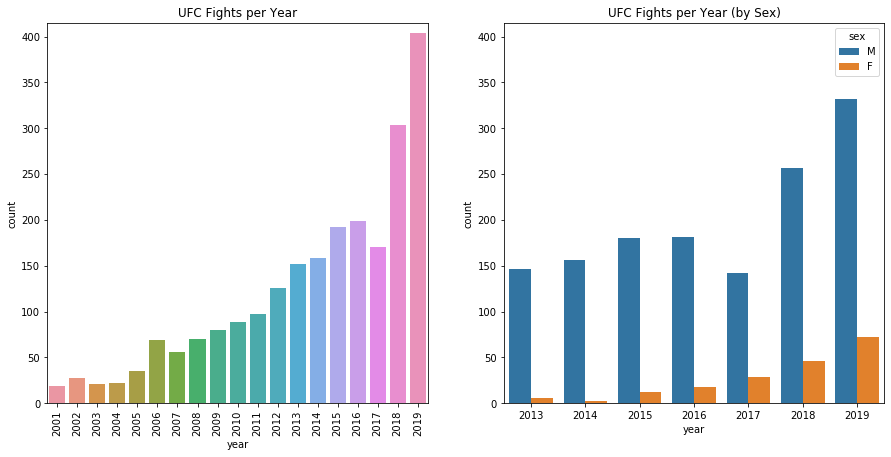

In [692]:
plt.figure(figsize=(15,7))
plt.subplot(121)
sns.countplot(x='year', data=fighters)
plt.title('UFC Fights per Year')
plt.ylim(0, 415)
plt.xticks(rotation=90)

plt.subplot(122)
sns.countplot(x='year', hue='sex', data=fighters[fighters.year > 2012])
plt.title('UFC Fights per Year (by Sex)')
plt.ylim(0, 415)
plt.show()

John observes that in general, the number of UFC fights is increasing at a substantial rate for both the men's and women's disciplines, although there are not nearly as many women's fights as men's. Next, he wants to examine the distribution of fights by weight class, once again separating for sex. 

As if in a dream, John once again begins rambling on to no one in particular about the weight classes is the UFC, "Both the men's and women's disciplines have several weight classes as detailed [here](http://todaysmma.com/ufc-weight-classes/).

(*screaches in markdown to produce the following pretty charts*)

| Men's Weight Division | Upper Limit (lbs) | Sex |
|:----:|:----:|:----:|
| Heavyweight | 265 | Men
| Light Heavyweight | 205 | Men
| Middleweight | 185 | Men
| Welterweight | 170 | Men
| Lightweight | 155 | Men
| Featherweight | 145 | Men / Women
| Bantamweight | 135 | Men / Women
| Flyweight | 125| Men / Women
| Strawweight | 115 | Women
| Catch Weight | ?? | Men / Women

Note that the men's and women's divisions both contain Featherweight, Bantamweight, and Flyweight classes. Additionally, the Catch Weight class is, as the name implies, a type of "catch-all" for weights, often used to save fights when one of the fighters doesn't make weight. It's also worth noting that some weight divisions were added later than others."

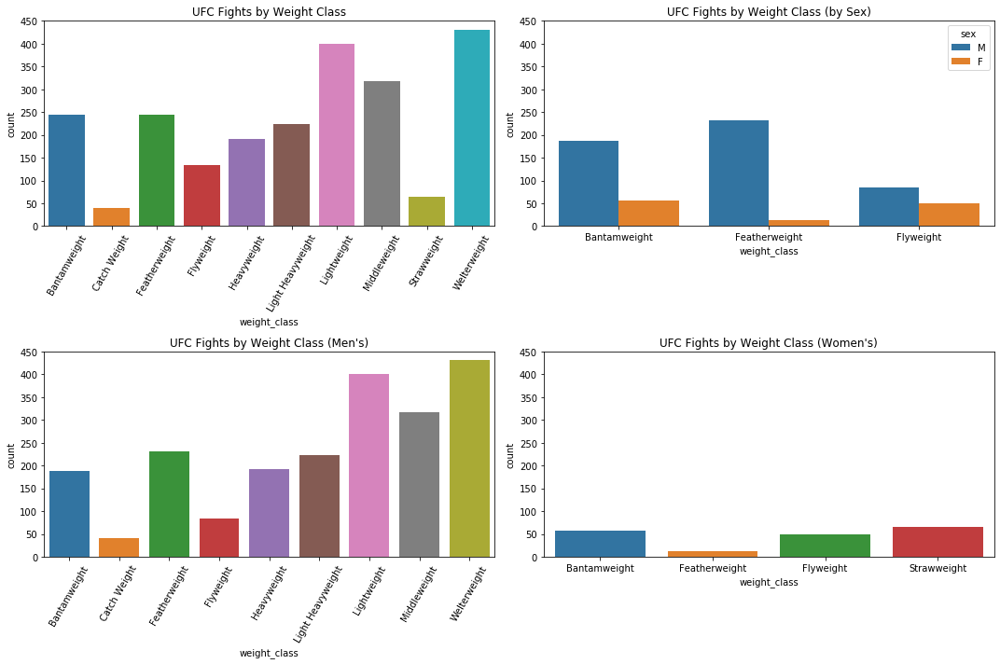

In [693]:
plt.figure(figsize=(15,10))
plt.subplot(221)
sns.countplot(x='weight_class', data=fighters.sort_values(by='weight_class'))
plt.title('UFC Fights by Weight Class')
plt.xticks(rotation=60) # rotate to avoid label overlap
plt.ylim(0, 450)

plt.subplot(222)
both = ['Flyweight', 'Bantamweight', 'Featherweight'] # only weight classes with both men and women
sns.countplot(x='weight_class', hue='sex', \
              data=fighters[fighters.weight_class.isin(both)].sort_values(by='weight_class'))
plt.title('UFC Fights by Weight Class (by Sex)')
plt.ylim(0, 450)

plt.subplot(223)
sns.countplot(x='weight_class', data=fighters[fighters.sex == 'M'].sort_values(by='weight_class'))
plt.title("UFC Fights by Weight Class (Men's)")
plt.xticks(rotation=60)
plt.ylim(0, 450)

plt.subplot(224)
sns.countplot(x='weight_class', data=fighters[fighters.sex == 'F'].sort_values(by='weight_class'))
plt.title("UFC Fights by Weight Class (Women's)")
plt.ylim(0, 450)

plt.tight_layout() # prevents plot overlap
plt.show()

From the visualizations, John makes several observations. In the men's category, the Lightweight and Welterweight classes have the most fights, whereas the Catch Weight and Flyweight classes have the least. For the women, the Bantamweight, Flyweight, Strawweight classes all have around the same number of fights, with the Featherweight class having fewer than them. Of the classes that contain both men and women, the Flyweight class has the closest proportion and the Featherweight the furthest proportion. 

John decides the next aspect to look at is the fight score. He first examines the top 20 fighters (1% of the total data).


In [694]:
best = fighters.nlargest(20, 'fight_score')
best

,name,weight_class,year,draw,losses,wins,stance,height_cms,reach_cms,weight_lbs,sex,fight_score
149,Jon Jones,Light Heavyweight,2019,1,1,18,Orthodox,193.04,213.36,205.0,M,17
2660,Georges St-Pierre,Welterweight,2013,0,2,19,Orthodox,180.34,193.04,185.0,M,17
2,Tony Ferguson,Lightweight,2019,0,1,14,Orthodox,180.34,193.04,155.0,M,13
2,Donald Cerrone,Lightweight,2019,0,5,17,Orthodox,185.42,185.42,155.0,M,12
248,Max Holloway,Featherweight,2018,0,3,15,Orthodox,180.34,175.26,155.0,M,12
412,Demetrious Johnson,Flyweight,2018,1,1,13,Orthodox,160.02,167.64,125.0,M,12
136,Junior Dos Santos,Heavyweight,2019,0,4,15,Orthodox,193.04,195.58,238.0,M,11
150,Kamaru Usman,Welterweight,2019,0,0,10,Switch,182.88,193.04,170.0,M,10
347,Khabib Nurmagomedov,Lightweight,2018,0,0,10,Orthodox,177.80,177.80,155.0,M,10
1220,Ryan Bader,Light Heavyweight,2016,0,5,15,Orthodox,187.96,187.96,205.0,M,10


He recognizes most of the fighters on the list as commonly regarded to be elite in their field, which reenforces his original choice of the fight score equation. John also realizes that all of these fighters are fighting in the men's divisions, so he takes the top 5 for women to compare.

In [695]:
fighters[fighters.sex == 'F'].nlargest(5, 'fight_score')

,name,weight_class,year,draw,losses,wins,stance,height_cms,reach_cms,weight_lbs,sex,fight_score
547,Amanda Nunes,Bantamweight,2018,0,1,9,Orthodox,172.72,175.26,145.0,F,8
425,Joanna Jedrzejczyk,Strawweight,2018,0,2,9,Orthodox,167.64,165.10,125.0,F,7
38,Jessica Andrade,Strawweight,2019,0,1,7,Orthodox,154.94,157.48,115.0,F,6
5,Tatiana Suarez,Strawweight,2019,0,0,5,NaN,165.10,167.64,115.0,F,5
9,Yan Xiaonan,Strawweight,2019,0,0,4,Orthodox,165.10,160.02,115.0,F,4


Here John can see that Amanda Nunes, the woman with the highest fight score, has an equivalent score to Dustin Poirier, the 20th of the highest fight scores. This difference can likely be explained by the UFC's timeline; women's events were not introduced until over a decade after the UFC formalized their rules, so there was more time for exceptional male athletes to rise and fall.

Next, he checks the total distribution of all fight scores.

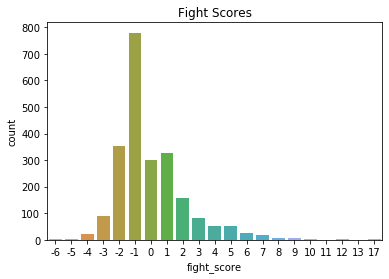

In [696]:
sns.countplot(x='fight_score', data=fighters)
plt.title('Fight Scores')
plt.show()

The distribution of fight scores is skewed right, with the center around -1. John decides this makes intuitive sense. If a fighter loses their first few fights, the UFC will not continue to schedule fights with them. Similarly, if a fighter continues to win, the UFC will continue to promote them for more fights.

Next, John decides to revisit the issue of inaccurate weights to see if they are an issue.

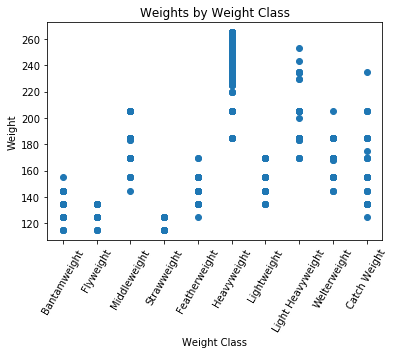

In [697]:
plt.scatter(fighters.weight_class, fighters.weight_lbs)
plt.xticks(rotation=60)
plt.xlabel('Weight Class')
plt.ylabel('Weight')
plt.title('Weights by Weight Class')
plt.show()

"..... oh boy," John exhales, "there's absolutely no way there should be almost 100 pound variations within normal weight classes." Disgruntled, John decides he has no choice but to drop that column. The silver lining is that from domain expertise, he knows that essentially every fighter will weigh-in close to the upper limit of their fight class, so he can simply use the weight class categories as a proxy (this does not necessarily always work, as many combat sports do not have an upper limit on their heavyweight division, but the UFC enforces one). 

In [698]:
fighters.drop('weight_lbs', axis=1, inplace=True)
fighters.head()

,name,weight_class,year,draw,losses,wins,stance,height_cms,reach_cms,sex,fight_score
0,Henry Cejudo,Bantamweight,2019,0,0,2,Orthodox,162.56,162.56,M,2
1,Valentina Shevchenko,Flyweight,2019,0,0,3,Southpaw,165.10,167.64,F,3
12,Joanne Calderwood,Flyweight,2019,0,1,3,Orthodox,167.64,165.10,F,2
11,Grigorii Popov,Bantamweight,2019,0,1,0,Switch,170.18,172.72,M,-1
10,Darren Stewart,Middleweight,2019,0,3,3,Orthodox,182.88,187.96,M,0


As a next step John decides to examine the relationship between fight score and reach. Unfortunately, this requires dropping all rows without reach data.

y = 0.021081749422246582 x + -3.655248426257989


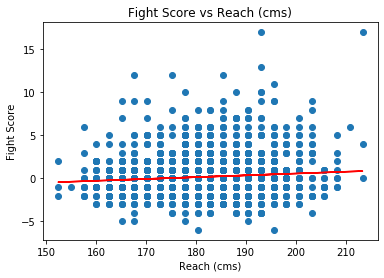

In [699]:
fighters = fighters[fighters.reach_cms.notnull()]
m,b = np.polyfit(fighters.reach_cms, fighters.fight_score, 1)
print('y =', m, 'x +', b)
plt.plot(fighters.reach_cms, fighters.fight_score, 'C0o', fighters.reach_cms, m*fighters.reach_cms+b, 'r')
plt.xlabel('Reach (cms)')
plt.ylabel('Fight Score')
plt.title('Fight Score vs Reach (cms)')
plt.show()

John notes that this is an extremely weak trend. However, this does make some sense. Fighters only fight against other fighters within their weight class, so a monster of a human being would have no advantage over a small scrappy fighter, assuming they are in two different weight class. To further examine the trends, he repeats this process while partitioning by weight class. He also plots the top 20 fighters from earlier in magenta. As an attempt to minimize clutter, he leaves off axes labels for the subplots, but notes the labels are the same as the above plot.

Bantamweight : y = 0.0008119988951817949 x + -0.10693830926731919
Mens:    y = -0.02098761264318655 x + 3.69303565697543
Womens:  y = 0.06489419174369943 x + -11.075503089843103


Flyweight : y = -0.002890278548102926 x + 0.5349155116763867
Mens:    y = -0.03383650491997439 x + 5.782970448532158
Womens:  y = 0.050550705331018554 x + -8.475453172205546


Middleweight : y = 0.03324854810617522 x + -6.056733204985314
Mens:    y = 0.03324854810617522 x + -6.056733204985314
Womens:  (N/A)


Strawweight : y = -0.07221846305401337 x + 11.815818927994002
Mens:    (N/A)
Womens:  y = -0.07221846305401337 x + 11.815818927994002


Featherweight : y = 0.024039213286102947 x + -4.2301367250036055
Mens:    y = 0.022919218814559474 x + -4.030849005204255
Womens:  y = 0.05860431568191441 x + -10.305343511450484


Heavyweight : y = 0.09180235371831069 x + -17.42470142732304
Mens:    y = 0.09180235371831069 x + -17.42470142732304
Womens:  (N/A)


Lightweight : y = 0.012485714891648294 x + -2.013469991869

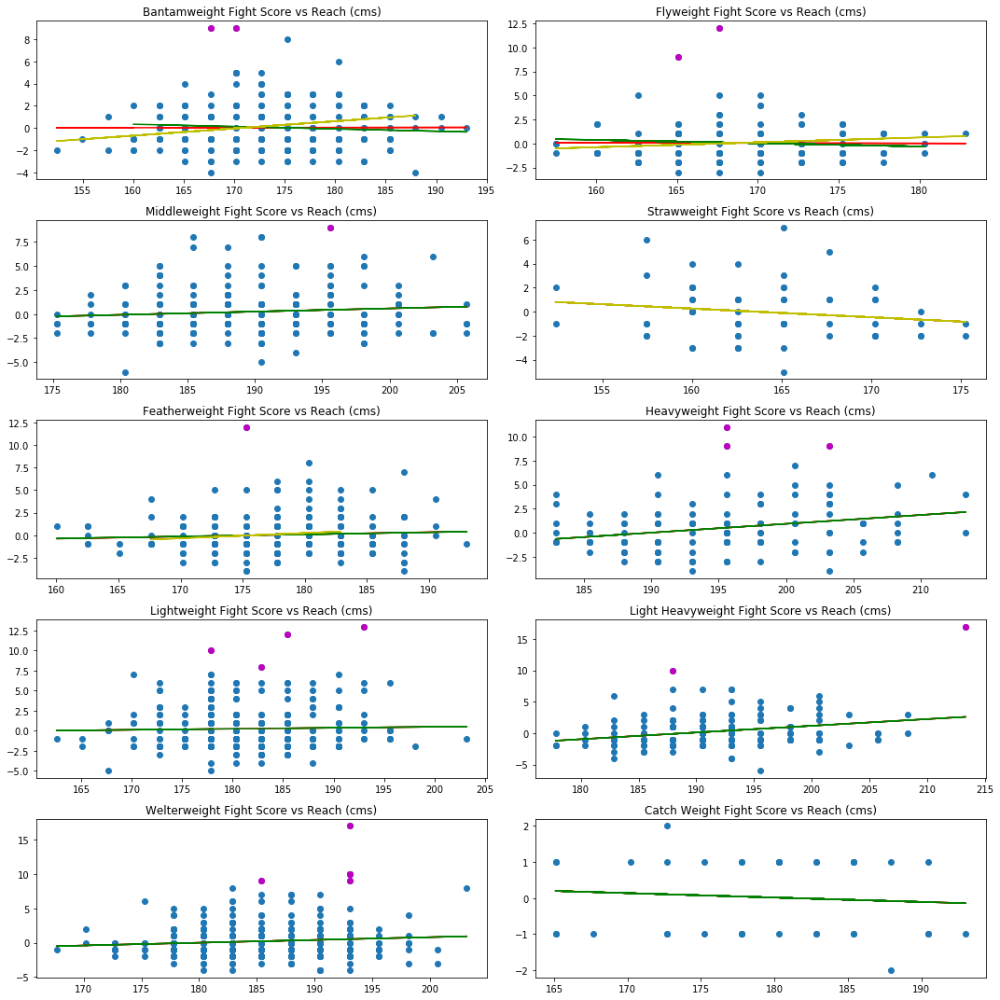

In [700]:
# get different weight classes
weights = fighters.weight_class.unique()

# to create subplots
rows = 5
cols = 2
index = 1

plt.figure(figsize=(15,15))

# plot for each weight class (only by sex if both sexes in weight class)
for weight in weights:
    plt.subplot(rows, cols, index)
    index += 1
    weight_df = fighters[fighters.weight_class == weight]
    weight_df = weight_df[weight_df.reach_cms.notnull()]
    weight_df_men = weight_df[weight_df.sex == 'M']
    weight_df_women = weight_df[weight_df.sex == 'F']
    
    # plot general regression line in yellow
    m,b = np.polyfit(weight_df.reach_cms, weight_df.fight_score, 1)
    plt.plot(weight_df.reach_cms, weight_df.fight_score, 'C0o', \
             weight_df.reach_cms, m*weight_df.reach_cms+b, 'r')
    print(weight, ': y =', m, 'x +', b)
    
    # plot men's regression line in yellow
    if len(weight_df_men.index) > 0:
        mm, bm = np.polyfit(weight_df_men.reach_cms, weight_df_men.fight_score, 1)
        plt.plot(weight_df_men.reach_cms, mm*weight_df_men.reach_cms+bm, 'g')
        print('Men''s:    y =', mm, 'x +', bm)
    else:
        print('Men''s:    (N/A)')
        
    # plot women's regression line in yellow
    if len(weight_df_women.index) > 0:
        mw, bw = np.polyfit(weight_df_women.reach_cms, weight_df_women.fight_score, 1)
        plt.plot(weight_df_women.reach_cms, mw*weight_df_women.reach_cms+bw, 'y')
        print('Women''s:  y =', mw, 'x +', bw)
    else:
        print('Women''s:  (N/A)')
    print('\n')
    
    # Plot top 20
    special = best[best.weight_class == weight]
    if len(special.index) > 0:
        plt.plot(special.reach_cms, special.fight_score, 'mo')
              
    plt.title(weight + ' Fight Score vs Reach (cms)')

plt.tight_layout()
plt.show()

John's primarily advantage in his future career is that he can choose his physical attributes to be more advantageous. Hence, it makes the most sense for him to fight in the divisions where the physical attributes will matter the most (have the steepest slope). From the graphs, he observes the ideal divisions are the light heavyweight and heavyweight classes. These also have the benefit of being directly adjacent in terms of weight, so John could feasibly accept fights in both.

He also notices that the regression lines for men and women within the same division, do not necessarily seem to agree.

Next, John decides to create a heapmap (or correlation matrix) to determine the correlations between physical characteristics.

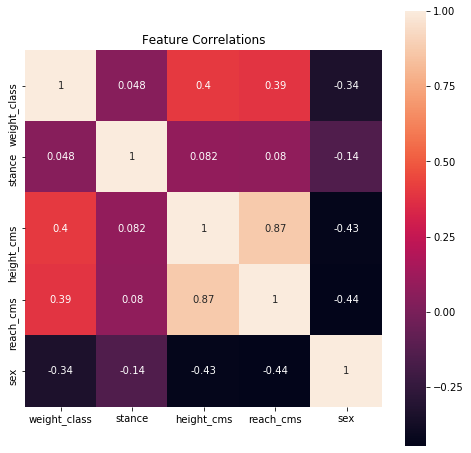

In [701]:
for_heat = fighters.copy()
for_heat['weight_class'] = pd.factorize(for_heat.weight_class)[0]
for_heat['stance'] = pd.factorize(for_heat.stance)[0]
for_heat['sex'] = pd.factorize(for_heat.sex)[0]

features = ['weight_class', 'stance', 'height_cms', 'reach_cms', 'sex']
for_heat = for_heat[features].corr()
plt.figure(figsize=(8,8))
ax = sns.heatmap(for_heat, square=True, annot=True)
bottom, top = ax.get_ylim() # need to adjust since Seaborn's heatmap has a bug that crops off top and bottom
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('Feature Correlations')
plt.show()

From the visualization, he notes that weight class, stance, and sex are decently uncorrelated, whereas height and reach have a strong correlation. When using these features to predict, John decides to make the simplifying assumption that reach and height will be correlated, so he will only use one of these features in the predictions. This avoids any complications with interactions between the two features.

## Round 4: Predicting Fight Results

Before John goes on predicting, he makes a final adjustment to the `fighters` DataFrame. As noticed in the EDA, the women's rows are decently different than the men's, and there is no information about the results of men fighting women. Given that John is interested in fighting in the men's division, he drops the female rows.

In [702]:
fighters = fighters[fighters.sex == 'M']
fighters.drop('sex', axis=1, inplace=True)
fighters.head()

,name,weight_class,year,draw,losses,wins,stance,height_cms,reach_cms,fight_score
0,Henry Cejudo,Bantamweight,2019,0,0,2,Orthodox,162.56,162.56,2
11,Grigorii Popov,Bantamweight,2019,0,1,0,Switch,170.18,172.72,-1
10,Darren Stewart,Middleweight,2019,0,3,3,Orthodox,182.88,187.96,0
8,Calvin Kattar,Featherweight,2019,0,1,4,Orthodox,180.34,182.88,3
6,Pedro Munhoz,Bantamweight,2019,1,4,8,Orthodox,167.64,165.10,4


It's finally time for John to create his model to predict fight scores. By trying to predict such scores, he can determine what attributes are the most valuable and adjust those with his serum. He creates a linear regression model using the features weight class, stance, and reach (along with help from this [article](https://towardsdatascience.com/simple-and-multiple-linear-regression-in-python-c928425168f9)).

In [703]:
fighters = fighters.dropna()
model = ols(formula='fight_score ~ weight_class + stance + reach_cms + (weight_class*reach_cms) + (stance*reach_cms)',
            data=fighters).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            fight_score   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     1.976
Date:                Mon, 16 Dec 2019   Prob (F-statistic):            0.00384
Time:                        20:21:43   Log-Likelihood:                -3940.8
No. Observations:                1710   AIC:                             7930.
Df Residuals:                    1686   BIC:                             8060.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

Note that this function works by adjusting a "baseline" value up or down depending on the different attributes, where one of the attributes is set as the baseline. In this case, it appears that Bantamweight is the baseline for the provided intercept term.

Note that an attribute has a statistically significant effect on the fight score if 0 is not present in that attributes confidence interval (the last two columns of the above summary). This is true *only* of the weight classes and reaches for the Heavyweight, Light Heavyweight, and Welterweight divisions, which solidifies John's decision to fight in the heaviest two divisions where the serum will provide the greatest advantage. Note that no stance is statistically significant.

The summary also provides other valuable statistical information. John reads off the R-squared score of 0.026, comprehending (by recalling [this resource](https://blog.minitab.com/blog/adventures-in-statistics-2/regression-analysis-how-do-i-interpret-r-squared-and-assess-the-goodness-of-fit)) that it indicates the model does not fit the data particularly well. Although disappointing this makes perfect sense. It's unreasonable to believe the entire success of a fighter should be easily traceable to soley their physical characteristics.

John next creates a plot of the residuals (actual fight score - the model's predicted fight score).

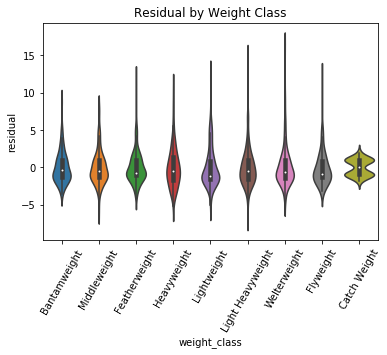

In [704]:
fighters['residual'] = fighters.fight_score - model.predict()
sns.violinplot(x='weight_class', y='residual', data=fighters)
plt.xticks(rotation=60)
plt.title('Residual by Weight Class')
plt.show()

While the long tails are obvious not a good sign, John takes comfort in the fact that the centers all appear to be unimodal and centered around 0 (except for catch weight, but that is an inherently weird division).

John's next step is to test the model. He will compare the predicted fight scores of each competitor for every fight, and predict that the winner is the one with the highest score (if the same score, he arbitrarily predicts the blue fighter to win, as draws are very unlikely). Before he does that however, he decides it is a good idea to gauge how well the fight score metric in general can predict the result of fights; this will more or less provide an upper bound on how will the fight score prediction can predict such results. He defines the function `calc_correct` which helps determine the number of correct predictions.

In [705]:
def calc_correct(row, metric):
    # get red fighter
    red_score = fighters[(fighters.name == row.R_fighter) & \
                        (fighters.weight_class == row.weight_class)].iloc[0][metric]

    # get blue fighter
    blue_score = fighters[(fighters.name == row.B_fighter) & \
                         (fighters.weight_class == row.weight_class)].iloc[0][metric]

    # assign a 1 if correct prediction, 0 otherwise
    if red_score > blue_score:
        result = 1 if row.Winner == 'Red' else 0
    else:
        result = 0 if row.Winner == 'Red' else 1
    
    return result

John can now use this function to validate his predictions.

In [706]:
fighters['predicted'] = model.predict()

# need to drop women and fights before 2001 from our original dataframe
weight_classes = fighters.weight_class.unique()
fights = fights[fights.weight_class.isin(weight_classes)].dropna()
fights = fights[fights.date.map(lambda x: int(x[:4]) > 2000)]

# calculate the number correct by fight score
print('Percentage correct from fight score: ' + \
      str(sum(tmp2.apply(lambda row: calc_correct(row, 'fight_score'), axis=1)) / len(fights.index)) + '%')

# calculate the number correct by fight score prediction
print('Percentage correct from fight score prediction: ' + \
      str(sum(tmp2.apply(lambda row: calc_correct(row, 'predicted'), axis=1)) / len(fights.index)) + '%')

Percentage correct from fight score: 0.7453117080587938%
Percentage correct from fight score prediction: 0.5283831728332489%


Sadly, John admits the linear regression model did not do a particularly good job at predicting the outcome of a fight. Yet, he reminds himself that it doesn't make much sense for an entire fight to be determined solely by physical characteristics.

## Round 5: Conclusions and Further Work

"Let's get to it!" John exclaims, feeling especially motivated to create his serum. His analysis has led him to the following conclusions,
* Use whatever stance is most comfortable, none seem to be noticeable advantageous
* Fight in the Light Heavyweight and Heavyweight divisions, as that is where extra reach (and thus height given their correlation) will be most beneficial
* Make reach (and height) as large as tolerable

Obviously, this last point is only useful to some degree. If John made himself 15 feet tall, then to be light enough to make weight he'd have to have almost no muscle. This limitation shows the flaws within a simple linear model.

John notes his work is far from over; he has the physical characteristics of an elite killing machine, but the technical fighting skills of... well, a computer science professor. His next step is to pursue mental and technical excellence with the world's most disciplined fighters. But given that the narrator of this story is stressed and it's finals week and he's running out of John's faces to photoshop on people, the next adventure will have to wait!

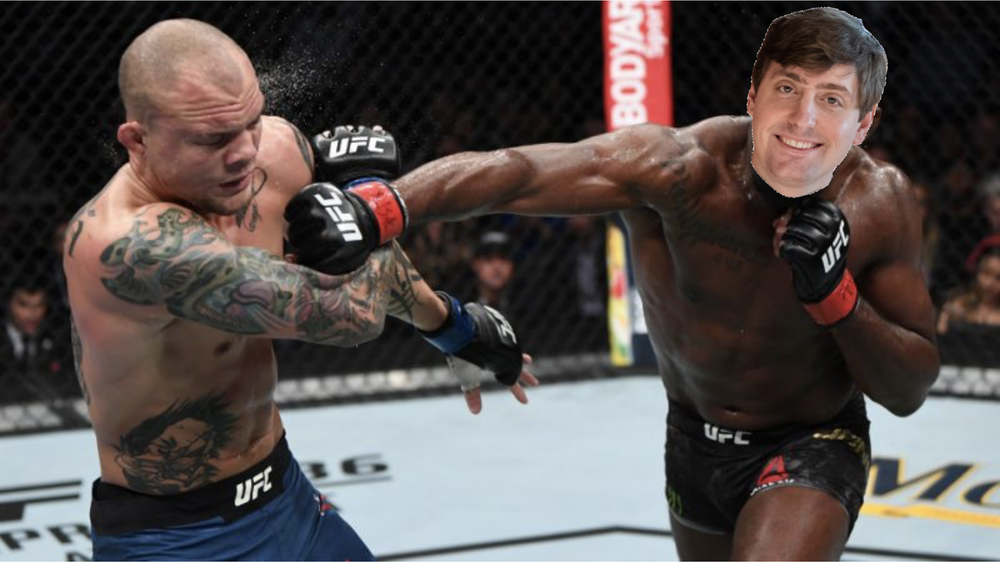

In [707]:
Image(filename="John2.png")

Thank you for reading this analysis--hopefully you enjoyed it! If you have any comments or suggestions on any material from this notebook from statistical methodology to the names of top dojo's for John to train at, don't hesitant to let me know.